# Data 

### Feature description 

- **Rooms:** Number of rooms

- **Price:** Price in dollars

- **Method:** S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available.

- **Type:** br - bedroom(s); h - house,cottage,villa, semi,terrace; u - unit, duplex; t - townhouse; dev site - development site; o res - other residential.

- **SellerG:** Real Estate Agent

- **Date:** Date sold

- **Distance:** Distance from CBD

- **Regionname:** General Region (West, North West, North, North east …etc)

- **Propertycount:** Number of properties that exist in the suburb.

- **Bedroom2:** Scraped # of Bedrooms (from different source)

- **Bathroom:** Number of Bathrooms

- **Car:** Number of carspots

- **Landsize:** Land Size

- **BuildingArea:** Building Size

- **CouncilArea:** Governing council for the area

In [1]:
# Import dependencies 

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px

# For default view 
pd.set_option("display.max_columns", 50)

In [2]:
# Import data 
df = pd.read_csv("/home/western/Documents/Data/melb_data.csv")
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [3]:
#df['method'].unique()

In [4]:
# Value count for columns 
cat_columns = df.select_dtypes(include=['object'])

frequency_count = {}
for cols in cat_columns:
    frequency_count[cols] = df[cols].value_counts()
    
# for column, counts in frequency_count.items():
#     print(f"Frequency count for: {cols}:")
#     print(counts)
#     print()

## Initial Data Exploration

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

## Descriptive statistics 

In [6]:
# Numeric columns 
df.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


In [7]:
# Categorical columns 
df.describe(include='O')

,Suburb,Address,Type,Method,SellerG,Date,CouncilArea,Regionname
count,13580,13580,13580,13580,13580,13580,12211,13580
unique,314,13378,3,5,268,58,33,8
top,Reservoir,36 Aberfeldie St,h,S,Nelson,27/05/2017,Moreland,Southern Metropolitan
freq,359,3,9449,9022,1565,473,1163,4695


In [8]:
print(df.columns)

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')


In [9]:
# Rename columns 

df = df.rename(columns={'SellerG':'real_estate_agent', 'Bathroom':'no_of_bathroom', 'Bedroom2': 'no_of_bedrooms',
                        'BuildingArea':'building_size', 'YearBuilt': 'year_built',
                        'CouncilArea':'council_area', 'Regionname':'region_name',
                        'Propertycount':'property_count', 'Lattitude':'latitude', 'Longtitude':'longitude' })

#change column names to lowercase
df.columns = df.columns.str.lower()

df.columns

Index(['suburb', 'address', 'rooms', 'type', 'price', 'method',
       'real_estate_agent', 'date', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'council_area', 'latitude', 'longitude', 'region_name',
       'property_count'],
      dtype='object')

# Data Cleaning 

## Duplicates 

In [10]:
df.duplicated(keep=False).sum()

0

- There are no duplicated entries in the dataset

## Missing values 

In [11]:
missing_values = df.isnull().sum()

In [12]:
# Total rows 
total_records = len(df)

# Missing values 
missing_values = df.isnull().sum()

# Percent missing values 
percent_missing_values = (missing_values/ total_records) * 100

# Use a DataFrame 
missing_values_df = pd.DataFrame({
    'missing_values': missing_values,
    'percentage (%)': percent_missing_values
})

print(f"Total records: {total_records}")
# Slice to only the missing values 
missing_values_df.iloc[10:18, :]





Total records: 13580


,missing_values,percentage (%)
no_of_bedrooms,0,0.000000
no_of_bathroom,0,0.000000
car,62,0.456554
landsize,0,0.000000
building_size,6450,47.496318
year_built,5375,39.580265
council_area,1369,10.081001
latitude,0,0.000000


In [13]:
df['landsize'] = df['landsize'].replace(0, np.nan)
df['building_size'] = df['building_size'].replace(0, np.nan)

In [14]:
# Total rows 
total_records = len(df)

# Missing values 
missing_values = df.isnull().sum()

# Percent missing values 
percent_missing_values = (missing_values/ total_records) * 100

# Use a DataFrame 
missing_values_df = pd.DataFrame({
    'missing_values': missing_values,
    'percentage (%)': percent_missing_values
})

print(f"Total records: {total_records}")
# Slice to only the missing values 
missing_values_df.iloc[10:18, :]


Total records: 13580


,missing_values,percentage (%)
no_of_bedrooms,0,0.000000
no_of_bathroom,0,0.000000
car,62,0.456554
landsize,1939,14.278351
building_size,6467,47.621502
year_built,5375,39.580265
council_area,1369,10.081001
latitude,0,0.000000


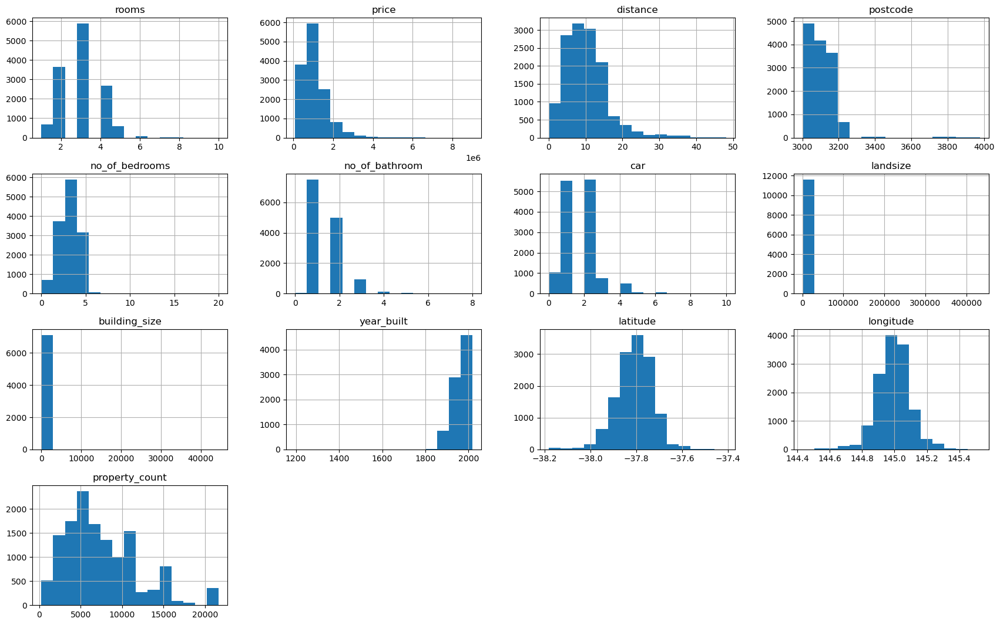

In [16]:
df.hist(bins=15, figsize=(21,13));

### Missing value imputation 

In [17]:
# Impute binary car column with modal value 
df['car'] = df['car'].fillna(df['car']).median()

# Impute council area with mode 
df['council_area']= df['council_area'].fillna(df['council_area'].mode()[0])

# # Impute building size and year built with median 
# df['buildind_size'] = df['building_size'].fillna(df[building_size].median())
# df['year'] = df['year'].fillna(df['year'].median())

# Check for remaining missing values
print(df.isnull().sum())

suburb                  0
address                 0
rooms                   0
type                    0
price                   0
method                  0
real_estate_agent       0
date                    0
distance                0
postcode                0
no_of_bedrooms          0
no_of_bathroom          0
car                     0
landsize             1939
building_size        6467
year_built           5375
council_area            0
latitude                0
longitude               0
region_name             0
property_count          0
dtype: int64


#### Building size and year

In [18]:
# # Function for random sampling, include random_state for reproducibility  

def random_sampling_imputation(df, column_name, random_state=None):
    if random_state is not None:
        np.random.seed(random_state)
    # Get the column
    column = df[column_name]
    # Get indices of missing values
    missing_indices = column[column.isnull()].index
    # Perform random sampling
    sampled_values = np.random.choice(column.dropna(), size=len(missing_indices))
    # Assign sampled values directly using .loc
    df.loc[missing_indices, column_name] = sampled_values
    return df

df = random_sampling_imputation(df, 'building_size', random_state=42)
df = random_sampling_imputation(df, 'year_built', random_state=42)
df = random_sampling_imputation(df, 'landsize', random_state=42)


- For building_size: 
- Random Sampling from Existing Values is better. It preserves natural variability and ensures imputed values reflect realistic distributions.

In [19]:
df.isnull().sum()

suburb               0
address              0
rooms                0
type                 0
price                0
method               0
real_estate_agent    0
date                 0
distance             0
postcode             0
no_of_bedrooms       0
no_of_bathroom       0
car                  0
landsize             0
building_size        0
year_built           0
council_area         0
latitude             0
longitude            0
region_name          0
property_count       0
dtype: int64

In [20]:
df.describe()

,rooms,price,distance,postcode,no_of_bedrooms,no_of_bathroom,car,landsize,building_size,year_built,latitude,longitude,property_count
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13580.0,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,2.0,700.701105,149.280093,1964.927835,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.0,6592.008990,401.997497,36.836570,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,2.0,1.000000,1.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,2.0,269.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.0,533.000000,125.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.0,676.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,2.0,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


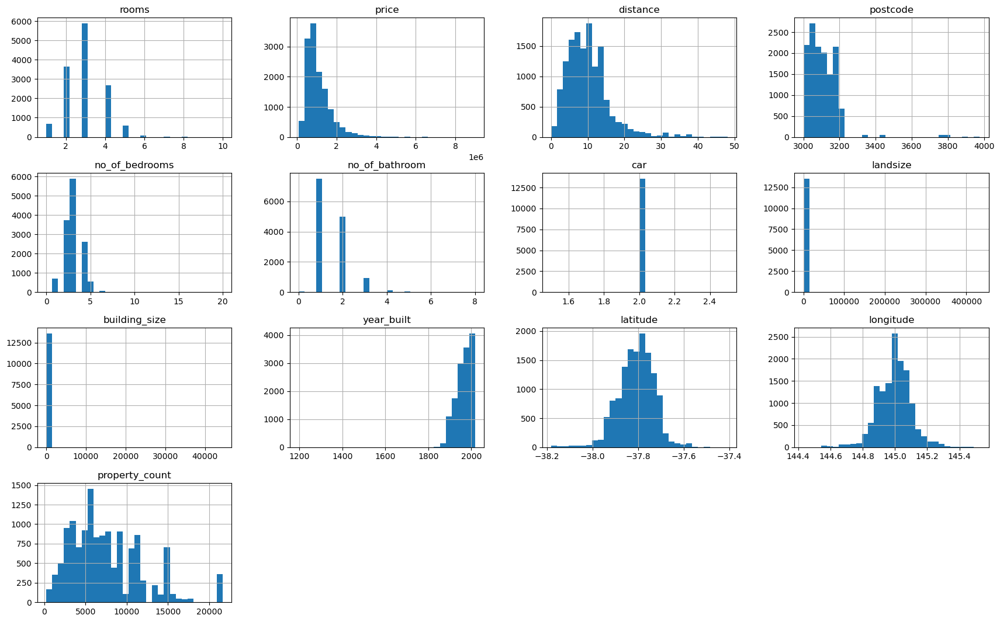

In [21]:
df.hist(bins=30, figsize=(21,13));


## Univariate Analysis 

### Data Distribution 

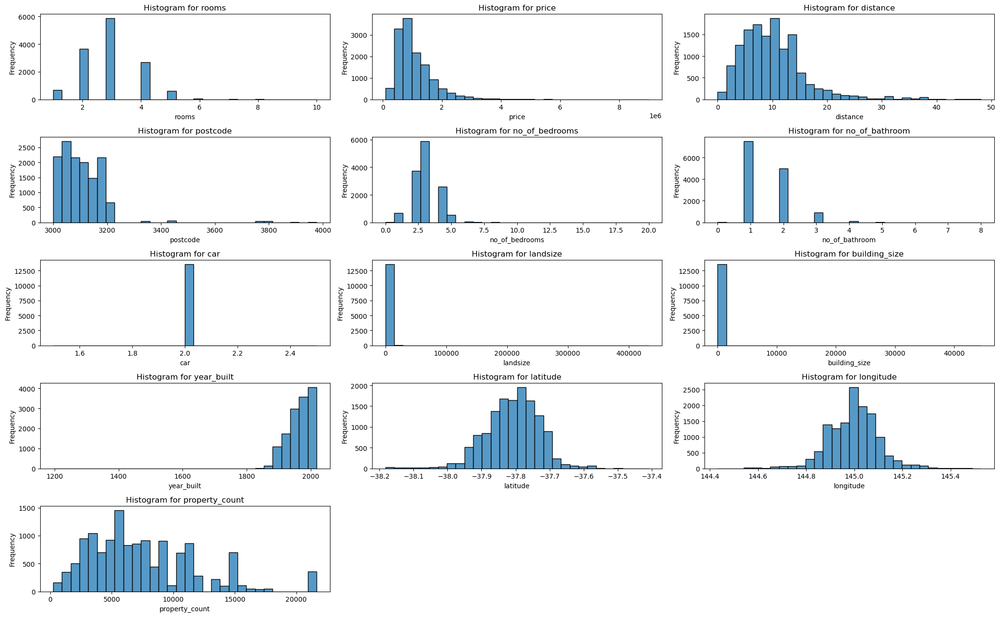

In [22]:
# Only select numeric columns 
numeric_columns = df.select_dtypes(include=['number']).columns[:]


# Define grd layout 
rows, cols = 5,3
fig, axes = plt.subplots(rows, cols, figsize=(21,13))

# Flatten the arrays 
axes = axes.flatten()

# Plot histograms for numeric columns 
for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], bins=30, ax=axes[i])
    axes[i].set_title(f'Histogram for {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    
    
# Hide empty subplots 
for j in range (i + 1, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## Observations 

- Latitude and longitude show normal distribution 

In [23]:
# Select categorical columns (object type)
cat_columns = df.select_dtypes(include=['O'])

print(cat_columns.columns)

Index(['suburb', 'address', 'type', 'method', 'real_estate_agent', 'date',
       'council_area', 'region_name'],
      dtype='object')


### For categorical columns 

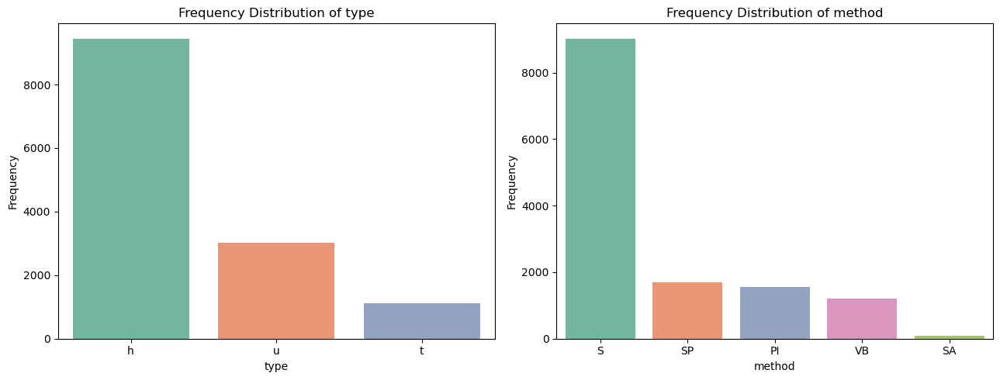

In [24]:
# Specify the categorical columns you want to plot
cat_columns = ['type', 'method']

# Define grid layout for the subplots
rows, cols = 1, 2  # Adjusted grid layout since you have 2 columns to plot
fig, axes = plt.subplots(rows, cols, figsize=(13, 5))

# Flatten the axes array to make indexing easier
axes = axes.flatten()

# Loop through each column and plot using Seaborn's countplot
for i, column in enumerate(cat_columns):
    # Use Seaborn's countplot for categorical data
    sns.countplot(data=df, x=column, ax=axes[i], palette='Set2', hue=column)
    
    # Set plot title and labels
    axes[i].set_title(f'Frequency Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].tick_params(axis='x', rotation=0)  # Rotate x labels for readability

plt.tight_layout()
plt.show()



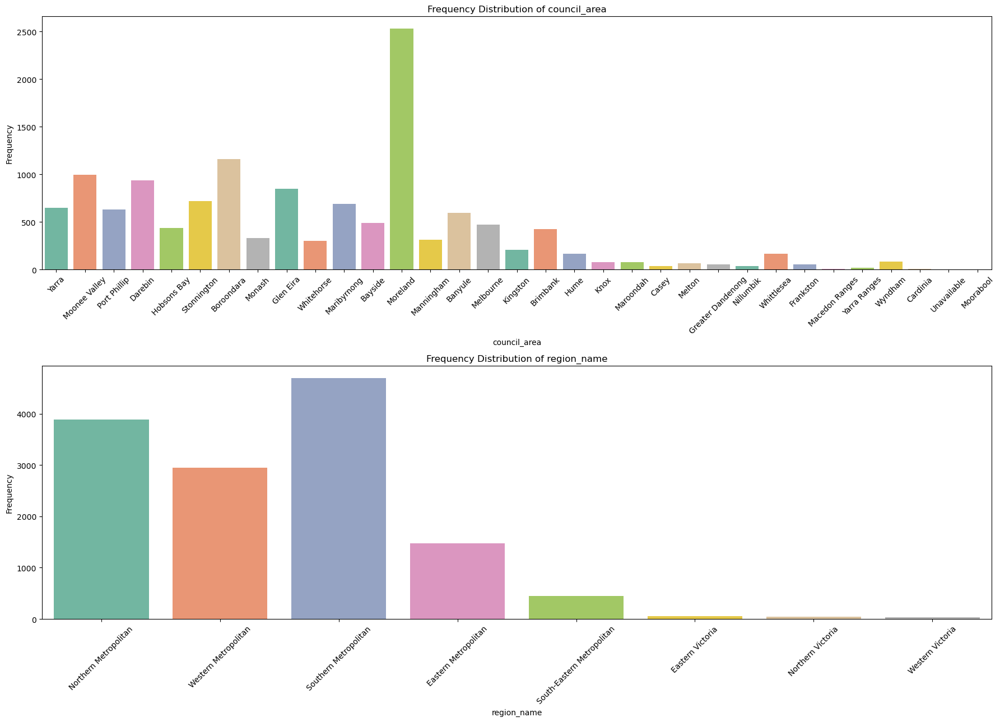

In [25]:
# Specify the categorical columns you want to plot
cat_columns = ['council_area', 'region_name']

# Define grid layout for the subplots
rows, cols = 2, 1  # Adjusted grid layout since you have 2 columns to plot
fig, axes = plt.subplots(rows, cols, figsize=(18, 13))

# Flatten the axes array to make indexing easier
axes = axes.flatten()

# Loop through each column and plot using Seaborn's countplot
for i, column in enumerate(cat_columns):
    # Use Seaborn's countplot for categorical data
    sns.countplot(data=df, x=column, ax=axes[i], palette='Set2', hue=column)
    
    # Set plot title and labels
    axes[i].set_title(f'Frequency Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x labels for readability

plt.tight_layout()
plt.show()


### Outliers 
- Box plot is ideal for non-normal distributions

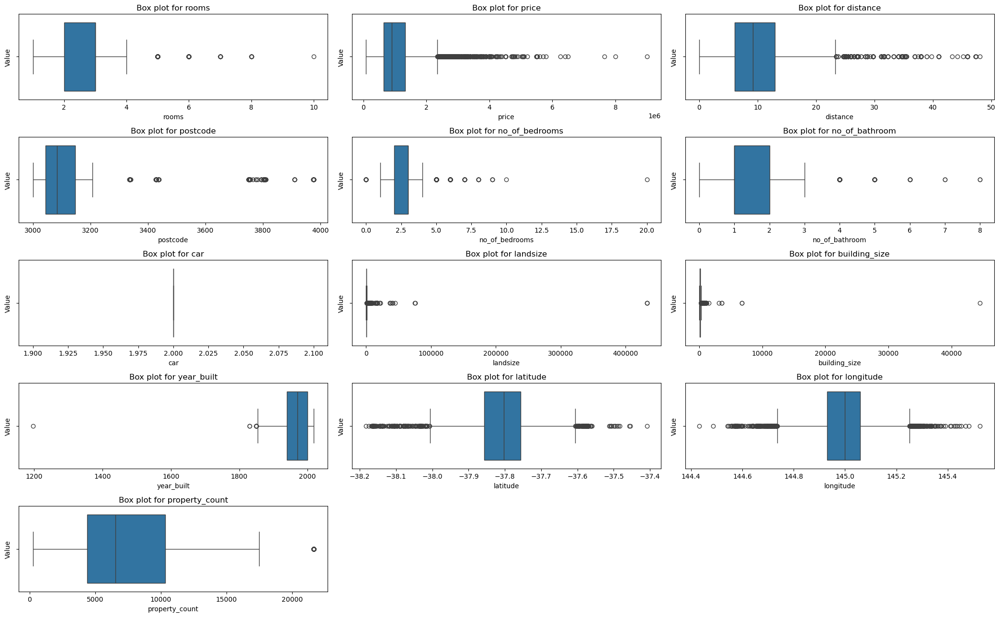

In [26]:
# Grid layout
rows, cols = 5, 3
fig, axes = plt.subplots(rows, cols, figsize=(21, 13))


# Flatten 
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df[column], ax = axes[i])
    axes[i].set_title(f"Box plot for {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Value')
    
# Hide empty subplots 
for j in range(i + 1, rows * cols):
    axes[j].axis('off')
    
plt.tight_layout()
plt.show()


### Drop outliers 

In [27]:
# Create a copy of the data
data_copy = df.copy()
# Select only numeric columns
numeric_data = data_copy.select_dtypes(include=['number'])

# Calculate q1, q3, and IQR for numeric data only
q1 = numeric_data.quantile(0.20)  # .25
q3 = numeric_data.quantile(0.80)  # .75
IQR = q3 - q1

# Lower and upper bounds for identifying outliers
lower_bound = q1 - (1.5 * IQR)
upper_bound = q3 + (1.5 * IQR)

# Identify outliers in numeric columns
outliers_ = set()
for col in numeric_data.columns:
    outliers = numeric_data[(numeric_data[col] < lower_bound[col]) | (numeric_data[col] > upper_bound[col])]
    outliers_.update(outliers.index)

# Count number of rows before removing outliers
num_rows_before = len(data_copy)

# Remove rows with outliers from the original DataFrame (important!)
data_copy = data_copy.drop(index=outliers_)

# Num of rows after removing outliers
num_rows_after = len(data_copy)

# Number of rows removed
rows_removed = num_rows_before - num_rows_after

# Print the results
print(f"Number of rows before removing outliers: {num_rows_before}")
print(f"Number of rows after removing outliers: {num_rows_after}")
print(f"Number of rows removed: {rows_removed}")

df = data_copy.copy()


Number of rows before removing outliers: 13580
Number of rows after removing outliers: 12114
Number of rows removed: 1466


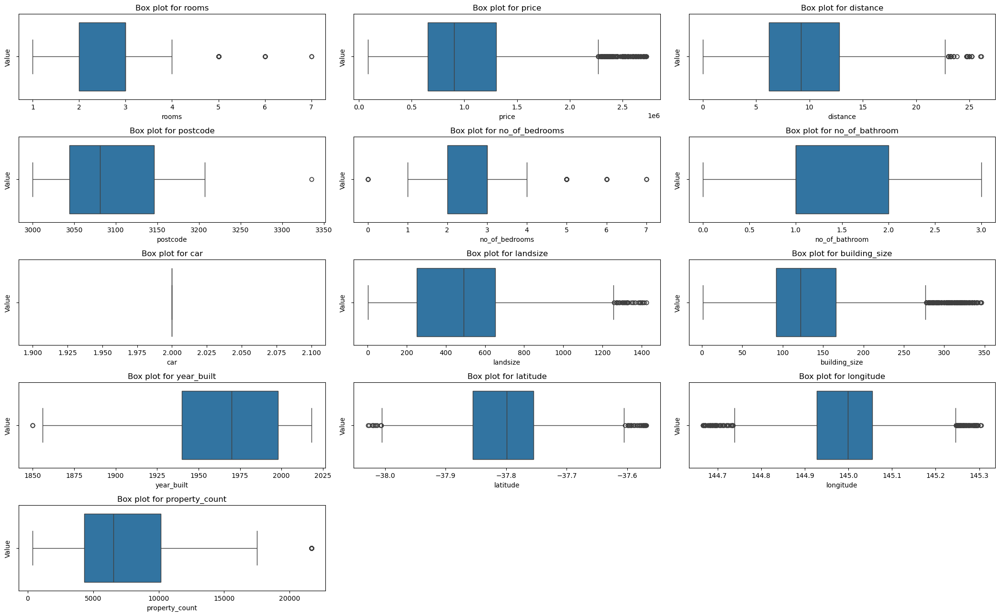

In [28]:
# Grid layout
rows, cols = 5, 3
fig, axes = plt.subplots(rows, cols, figsize=(21, 13))


# Flatten 
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df[column], ax = axes[i])
    axes[i].set_title(f"Box plot for {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Value')
    
# Hide empty subplots 
for j in range(i + 1, rows * cols):
    axes[j].axis('off')
    
plt.tight_layout()
plt.show()

In [29]:
print(df.columns)

Index(['suburb', 'address', 'rooms', 'type', 'price', 'method',
       'real_estate_agent', 'date', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'council_area', 'latitude', 'longitude', 'region_name',
       'property_count'],
      dtype='object')


In [30]:
num_columns = df.select_dtypes(include=['number'])
print(num_columns.columns)

Index(['rooms', 'price', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'latitude', 'longitude', 'property_count'],
      dtype='object')


## Bivariate Analysis 

### Price vs numerical features

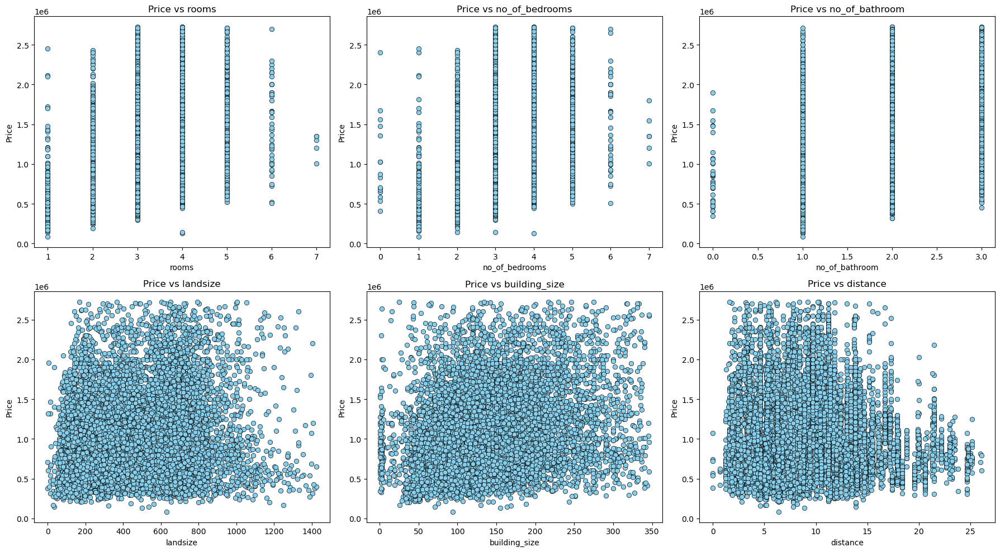

In [31]:

# List of columns to compare with 'Price'
columns_to_compare = ['rooms', 'no_of_bedrooms', 'no_of_bathroom', 'landsize', 'building_size', 'distance']

# Define the layout of the subplots (adjusting the number of rows and columns)
rows, cols = 2, 3  # Two rows and three columns for six plots
fig, axes = plt.subplots(rows, cols, figsize=(18, 10))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through each column and create a scatter plot
for i, column in enumerate(columns_to_compare):
    # Create a scatter plot with Seaborn
    sns.scatterplot(data=df, x=column, y='price', ax=axes[i], color='skyblue', edgecolor='black')
    

    # Set the title, labels, and grid
    axes[i].set_title(f'Price vs {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Price')
    #axes[i].grid(True)

plt.tight_layout()
plt.show()


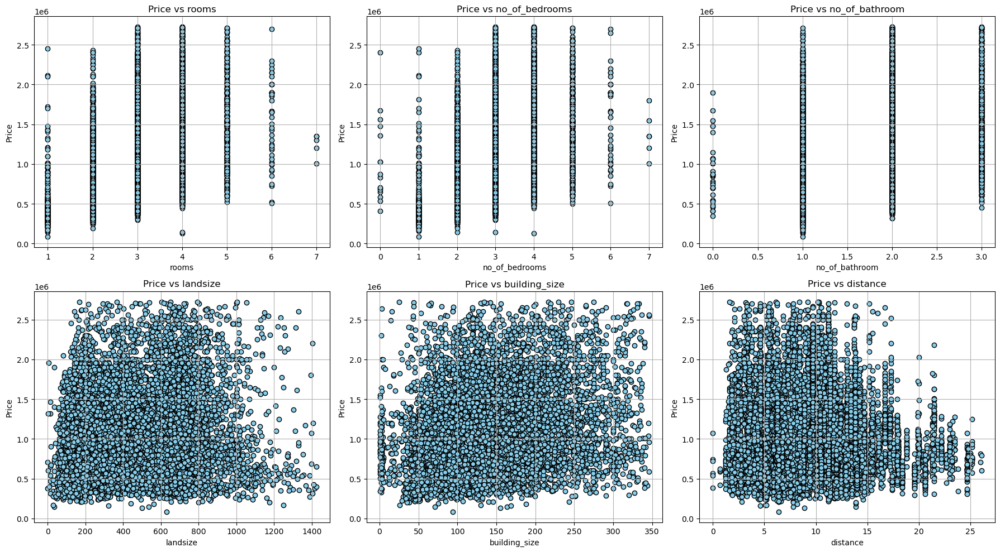

In [32]:

# List of columns to compare with 'Price'
columns_to_compare = ['rooms', 'no_of_bedrooms', 'no_of_bathroom', 'landsize', 'building_size', 'distance']

# Define the layout of the subplots
rows, cols = 2, 3  # Two rows and three columns for six plots
fig, axes = plt.subplots(rows, cols, figsize=(18, 10))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through each column and create a scatter plot
for i, column in enumerate(columns_to_compare):
    # Create a scatter plot with Matplotlib
    axes[i].scatter(df[column], df['price'], color='skyblue', edgecolor='black')

    # Set the title, labels, and grid
    axes[i].set_title(f'Price vs {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Price')
    axes[i].grid(True)

plt.tight_layout()
plt.show()

# Comparing categorical columns features with price 

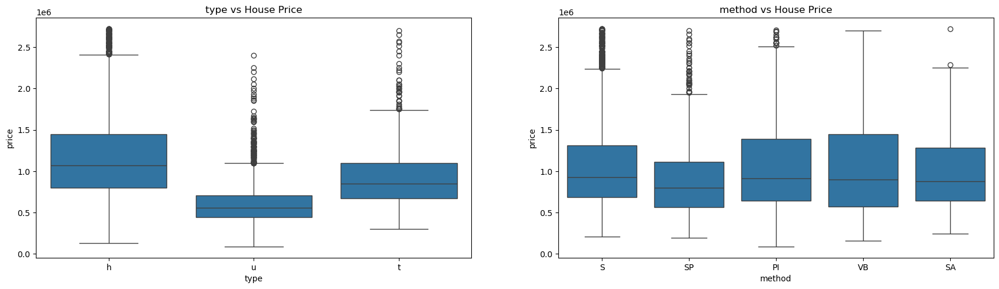

In [33]:
plt.figure(figsize=(21, 18))

# List of categorical columns 
cat_columns = ['type', 'method']

# Loop through 
for i, col in enumerate(cat_columns):
    # Subplots 
    plt.subplot(3, 2, i+1)
    
    # Create boxplot 
    sns.boxplot(x=df[col], y=df['price'])
    
    # Title 
    plt.title(f"{col} vs House Price")



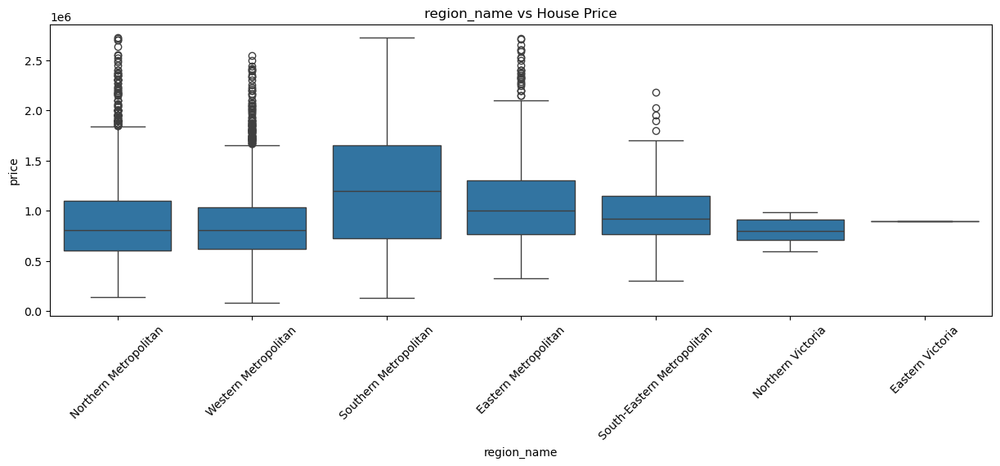

In [34]:
plt.figure(figsize=(24, 15))

# List of categorical columns 
cat_columns = ["region_name"]

# Loop through 
for i, col in enumerate(cat_columns):
    # Subplots 
    plt.subplot(3, 2, i+1)
    
    # Create boxplot 
    sns.boxplot(x=df[col], y=df['price'])
    
    # Title 
    plt.title(f"{col} vs House Price")
    plt.tick_params(axis='x', rotation=45)
    plt.tight_layout()
    plt.show()


### Region name 

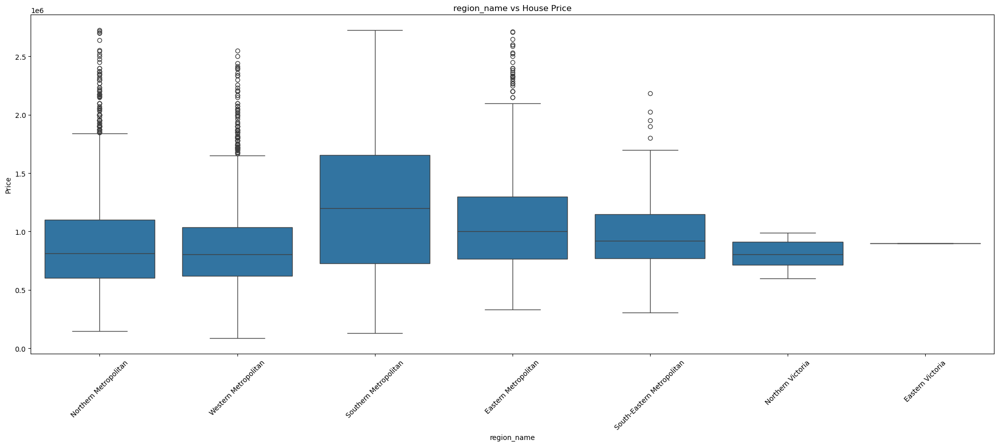

In [35]:
plt.figure(figsize=(20, 9))

# List of categorical columns
cat_columns = ['region_name']

# Loop through
for i, col in enumerate(cat_columns):
    # Create boxplot 
    plt.subplot(1, len(cat_columns), i + 1) #Only create as many subplots as needed
    sns.boxplot(x=df[col], y=df['price'])
    plt.title(f"{col} vs House Price")
    plt.tick_params(axis='x', rotation=45)

    plt.xlabel(col) #Explicitly set the x-axis label
    plt.ylabel('Price') # Explicitly set the y-axis label
    plt.tight_layout()  # Adjusts spacing between subplots
    plt.show()




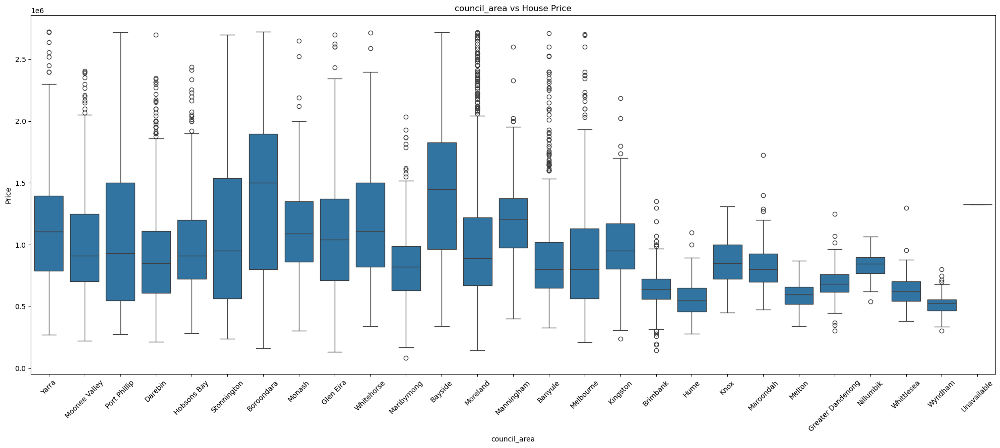

In [36]:
plt.figure(figsize=(20, 9))

# List of categorical columns
cat_columns = ['council_area']

# Loop through
for i, col in enumerate(cat_columns):
    # Create boxplot 
    plt.subplot(1, len(cat_columns), i + 1) #Only create as many subplots as needed
    sns.boxplot(x=df[col], y=df['price'])
    plt.title(f"{col} vs House Price")
    plt.tick_params(axis='x', rotation=45)

    plt.xlabel(col) #Explicitly set the x-axis label
    plt.ylabel('Price') # Explicitly set the y-axis label
    plt.tight_layout()  # Adjusts spacing between subplots
    plt.show()




### Method

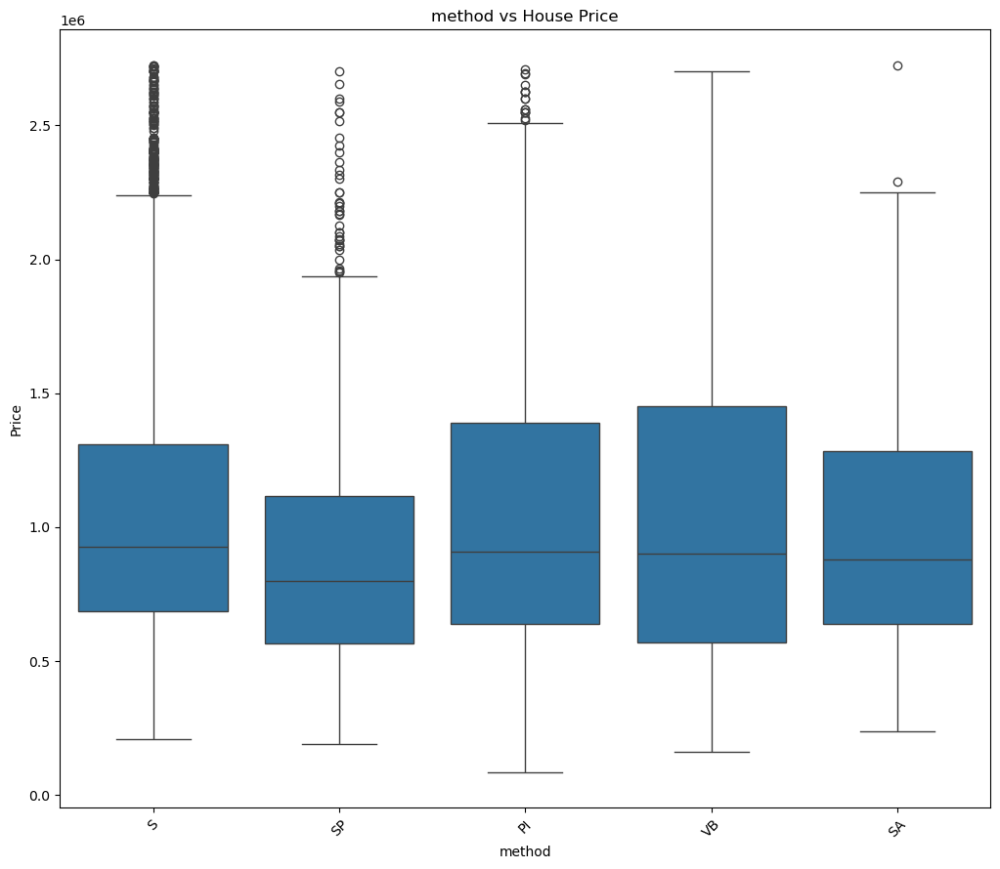

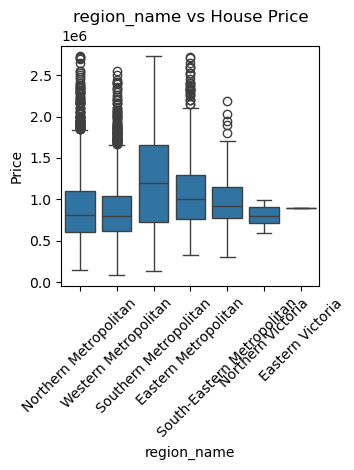

In [37]:
plt.figure(figsize=(20, 9))

# List of categorical columns
cat_columns = ['method', 'region_name']

# Loop through
for i, col in enumerate(cat_columns):
    # Create boxplot 
    plt.subplot(1, len(cat_columns), i + 1) #Only create as many subplots as needed
    sns.boxplot(x=df[col], y=df['price'])
    plt.title(f"{col} vs House Price")
    plt.tick_params(axis='x', rotation=45)

    plt.xlabel(col) #Explicitly set the x-axis label
    plt.ylabel('Price') # Explicitly set the y-axis label
    plt.tight_layout()  # Adjusts spacing between subplots
    plt.show()



### Region name

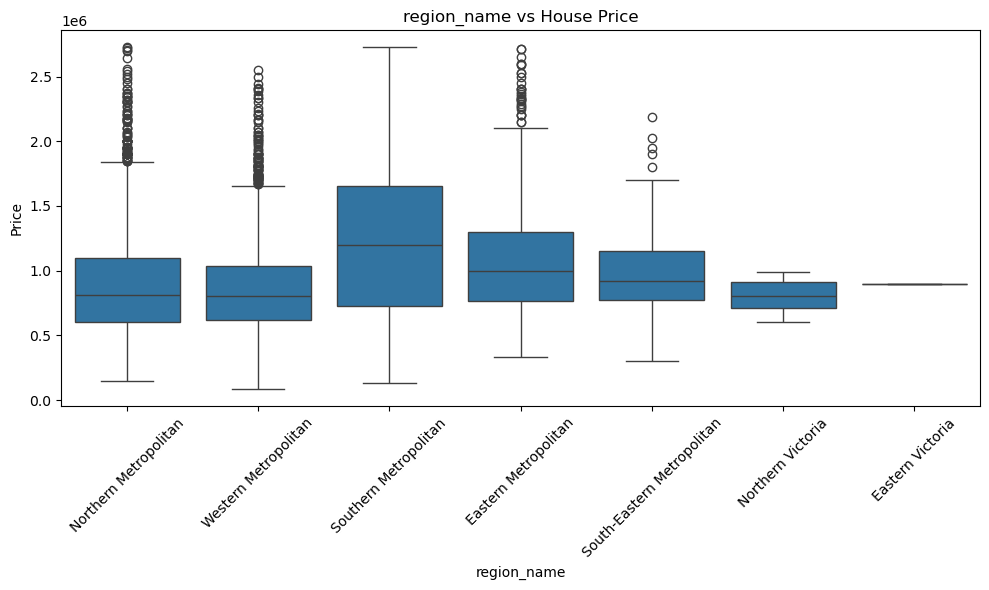

In [38]:
plt.figure(figsize=(10, 6))  # Adjusted figure size

# List of categorical columns
cat_columns = ['region_name']

# Loop through
for i, col in enumerate(cat_columns):
    # Create boxplot 
    plt.subplot(1, len(cat_columns), i + 1) #Only create as many subplots as needed
    sns.boxplot(x=df[col], y=df['price'])
    plt.title(f"{col} vs House Price")
    plt.tick_params(axis='x', rotation=45)
    plt.xlabel(col) #Explicitly set the x-axis label
    plt.ylabel('Price') # Explicitly set the y-axis label

plt.tight_layout()  # Adjusts spacing between subplots
plt.show()

### Cross tab 
- Categorical vs Categorical:
Method vs Type:
Crosstab or stacked bar plot to see how auction method is distributed across property types.

In [39]:
# Crosstab to see the relationship between 'Method' and 'Type'
crosstab = pd.crosstab(df['method'], df['type'])
print(crosstab)


type       h    t     u
method                 
PI       944  130   314
S       5801  697  1608
SA        57    7    17
SP       953  134   416
VB       618   99   319


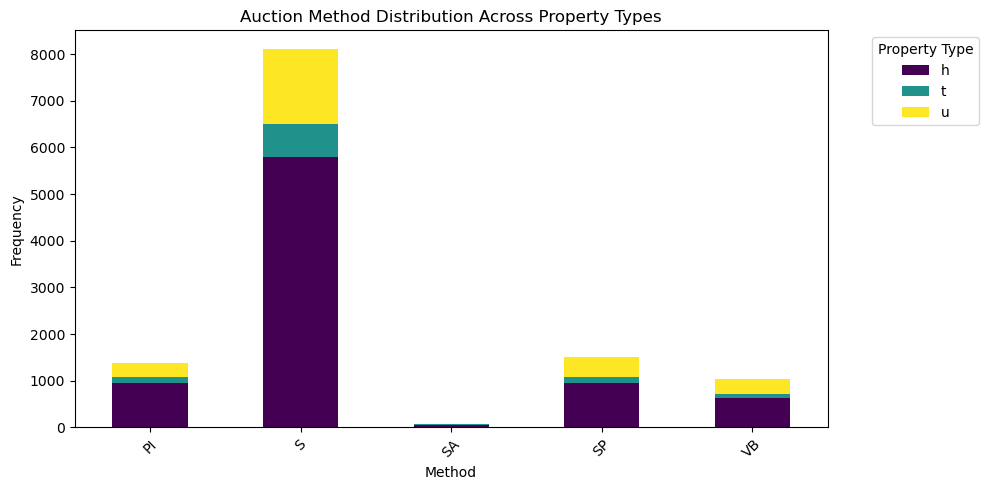

In [40]:
# Crosstab to get the frequency distribution
crosstab = pd.crosstab(df['method'], df['type'])

# Plot the stacked bar plot
crosstab.plot(kind='bar', stacked=True, figsize=(10, 5), colormap='viridis')

# Set titles and labels
plt.title('Auction Method Distribution Across Property Types')
plt.xlabel('Method')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.legend(title='Property Type', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside
plt.tight_layout()
plt.show()


## Multivariate analysis 

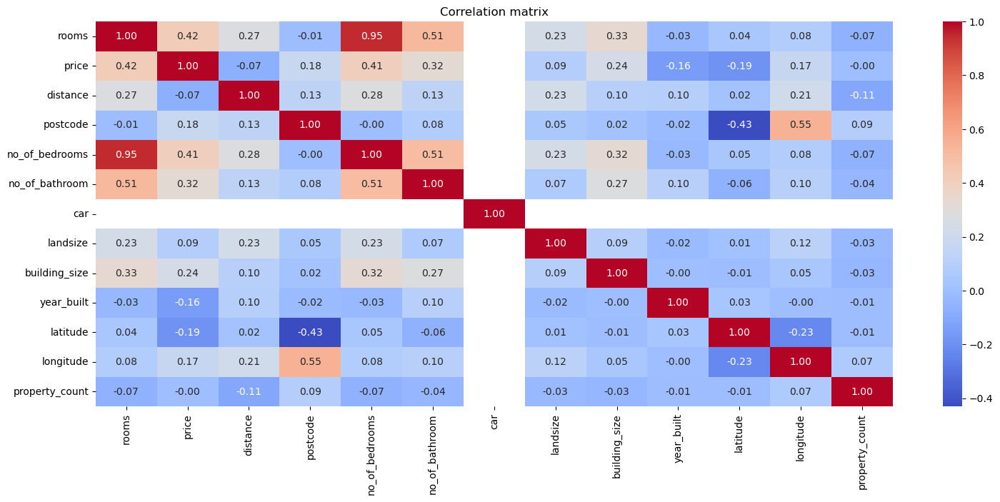

In [41]:
numeric_columns = df.select_dtypes(include=['number']).columns

# Correlation matrix 
corr_matrix = df[numeric_columns].corr(method='kendall')

# Plot 
plt.figure(figsize=(18, 7))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

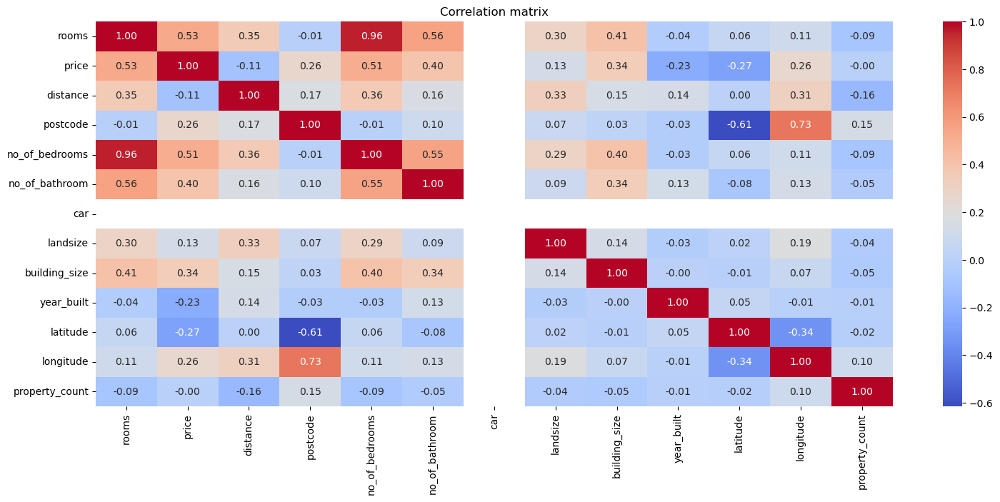

In [42]:
numeric_columns = df.select_dtypes(include=['number']).columns

# Correlation matrix 
corr_matrix = df[numeric_columns].corr(method='spearman')

# Plot 
plt.figure(figsize=(18, 7))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

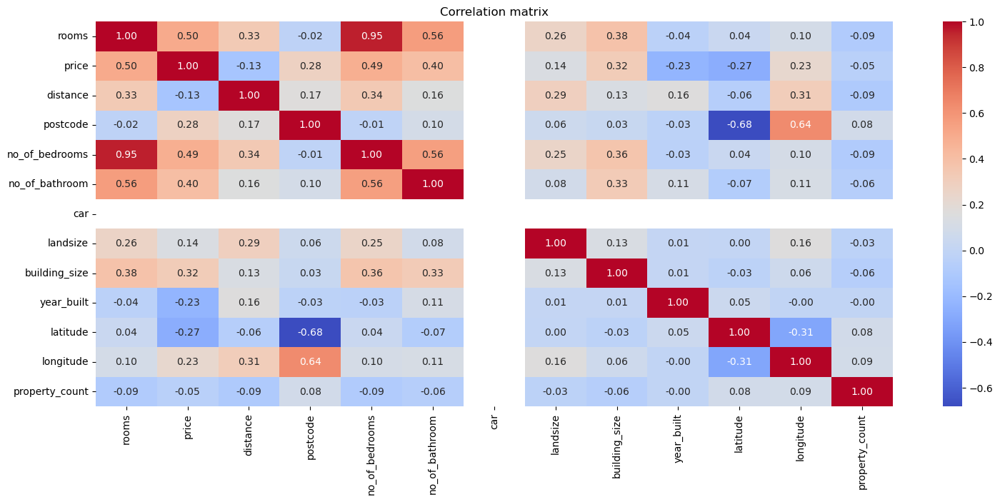

In [43]:
numeric_columns = df.select_dtypes(include=['number']).columns

# Correlation matrix 
corr_matrix = df[numeric_columns].corr(method='pearson')

# Plot 
plt.figure(figsize=(18, 7))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

### Price Variations by Region: 
- Explore which regions have the highest and lowest prices and identify patterns in suburban growth.

In [44]:
price_region = df.groupby(['region_name'])[['price']].mean().reset_index()
price_region.head()

,region_name,price
0,Eastern Metropolitan,1.067329e+06
1,Eastern Victoria,9.000000e+05
2,Northern Metropolitan,8.905122e+05
3,Northern Victoria,8.011250e+05
4,South-Eastern Metropolitan,9.668851e+05


In [45]:
import plotly.express as px

fig = px.bar(price_region, x='region_name',
            y='price', color= 'region_name',
            title = 'Price variation by Region')

fig.update_layout(width=850, height=400
)

In [46]:
# Correct column names for features
features = ['region_name', 'landsize']

# Scatter plots for Price vs Features grouped by Property Type
for feature in features:
    fig = px.scatter(
        df,
        x=feature,
        y='price',
        color='type',
        title=f'Price vs {feature.replace("_", " ").capitalize()} by Property Type',
        labels={feature: feature.replace("_", " ").capitalize(), 'price': 'Price'},
        opacity=0.7,
        template='plotly_white'
    )
    fig.show()


In [47]:

# Aggregate average price by property type
type_avg_price = df.groupby('type')['price'].mean().reset_index().sort_values(by='price', ascending=False)

# Visualize average prices by property type using Plotly
fig = px.bar(
    type_avg_price,
    x='type',
    y='price',
    title='Average Price by Property Type',
    labels={'type': 'Property Type', 'price': 'Average Price'},
    text='price',
    color='price',
    color_continuous_scale='Blues'
)
fig.update_layout(template='plotly_white')
fig.show()



In [48]:
# Correct column names for features
features = ['rooms', 'no_of_bathroom', 'landsize']

# Scatter plots for Price vs Features grouped by Property Type
for feature in features:
    fig = px.scatter(
        df,
        x=feature,
        y='price',
        color='type',
        title=f'Price vs {feature.replace("_", " ").capitalize()} by Property Type',
        labels={feature: feature.replace("_", " ").capitalize(), 'price': 'Price'},
        opacity=0.7,
        template='plotly_white'
    )
    fig.show()


In [49]:
numeric_data = data_copy.select_dtypes(include=['number'])
print(numeric_data.columns)

Index(['rooms', 'price', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'latitude', 'longitude', 'property_count'],
      dtype='object')


### Combine number of bathroom and number of bedrooms to rooms 

In [50]:
df['total_rooms'] = df['rooms'] + df["no_of_bathroom"] + df['no_of_bedrooms']

# Correct column names for features
features = ['total_rooms']

# Scatter plots for Price vs Features grouped by Property Type
for feature in features:
    fig = px.scatter(
        df,
        x=feature,
        y='price',
        color='type',
        title=f'Price vs {feature.replace("_", " ").capitalize()} by Property Type',
        labels={feature: feature.replace("_", " ").capitalize(), 'price': 'Price'},
        opacity=0.7,
        template='plotly_white'
    )
    fig.show()

## Method, price and type

In [51]:
# Correct column names for features
features = ['method']

# Scatter plots for Price vs Features grouped by Property Type
for feature in features:
    fig = px.scatter(
        df,
        x=feature,
        y='price',
        color='type',
        title=f'Price vs {feature.replace("_", " ").capitalize()} by Property Type',
        labels={feature: feature.replace("_", " ").capitalize(), 'price': 'Price'},
        opacity=0.7,
        template='plotly_white'
    )
    fig.show()

In [52]:

# 1. Calculate Agent Performance Metrics
agent_performance = df.groupby('real_estate_agent').agg(
    average_price=('price', 'mean'),
    total_sales=('price', 'count')
).reset_index()

# 2. Add a Rank Column for Average Price and Total Sales
agent_performance['price_rank'] = agent_performance['average_price'].rank(ascending=False)
agent_performance['sales_rank'] = agent_performance['total_sales'].rank(ascending=False)

# Sort by Price Rank
agent_performance = agent_performance.sort_values(by='price_rank')

# Display Top Agents
top_agents = agent_performance.head(10)

top_agents

,real_estate_agent,average_price,total_sales,price_rank,sales_rank
110,Lucas,2450000.0,1,1.0,206.5
141,North,2200000.0,1,2.0,206.5
21,Blue,2180000.0,1,3.0,206.5
205,Upper,2100000.0,1,4.0,206.5
218,White,2035000.0,1,5.0,206.5
159,Private/Tiernan's,1880000.0,1,6.0,206.5
212,WHITEFOX,1820000.0,1,7.0,206.5
175,Real,1812500.0,2,8.0,159.0
66,Fletchers/One,1800000.0,1,9.5,206.5
96,Joe,1800000.0,1,9.5,206.5


In [53]:
# Plot Average Price by Agent (Top 10 by Price)
fig = px.bar(
    top_agents,
    x='real_estate_agent',
    y='average_price',
    title='Top 10 Agents by Average Sale Price',
    labels={'real_estate_agent': 'Agent', 'average_price': 'Average Price'},
    color='average_price',
    color_continuous_scale='Viridis'
)
fig.update_layout(template='plotly_white', xaxis_tickangle=45)
fig.show()



In [54]:
# 4. Plot Total Sales by Agent (Top 10 by Frequency)
top_sales_agents = agent_performance.sort_values(by='sales_rank').head(10)

fig = px.bar(
    top_sales_agents,
    x='real_estate_agent',
    y='total_sales',
    title='Top 10 Agents by Total Sales',
    labels={'real_estate_agent': 'Agent', 'total_sales': 'Total Sales'},
    color='total_sales',
    color_continuous_scale='Plasma'
)
fig.update_layout(template='plotly_white', xaxis_tickangle=45)
fig.show()



In [55]:
# 5. Combined Metrics (Scatter Plot: Average Price vs Total Sales)
fig = px.scatter(
    agent_performance,
    x='total_sales',
    y='average_price',
    size='total_sales',
    color='average_price',
    title='Agent Performance: Average Price vs Total Sales',
    labels={'total_sales': 'Total Sales', 'average_price': 'Average Price'},
    hover_data=['real_estate_agent', 'price_rank', 'sales_rank'],
    template='plotly_white',
    color_continuous_scale='Magma'
)
fig.show()

## Monthly Mean house prices 

In [56]:
# Correctly parse the date column (assuming MM/DD/YYYY format)
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')


# Extract year and month for additional analysis
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month




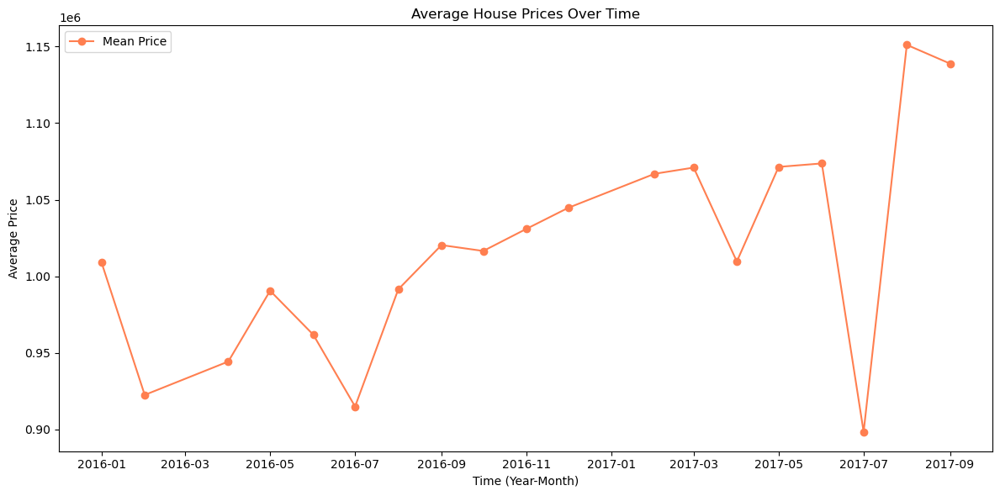

In [57]:
# Ensure 'Date' is in datetime format
df['date'] = pd.to_datetime(df['date'])

# Aggregate by year and month to calculate the mean price
monthly_trend = df.groupby(df['date'].dt.to_period('M'))['price'].mean()

# Reset index to use for plotting
monthly_trend = monthly_trend.reset_index()
monthly_trend['date'] = monthly_trend['date'].dt.to_timestamp()

# Plot the monthly price trend
plt.figure(figsize=(12, 6))
plt.plot(monthly_trend['date'], monthly_trend['price'], marker='o', color='coral', label='Mean Price', )
plt.title('Average House Prices Over Time')
plt.xlabel('Time (Year-Month)')
plt.ylabel('Average Price')
# plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()


In [58]:
import plotly.express as px

# Ensure 'date' is in datetime format
df['date'] = pd.to_datetime(df['date'])

# Aggregate by year and month to calculate the mean price
monthly_trend = df.groupby(df['date'].dt.to_period('M'))['price'].mean()

# Reset index to use for plotting
monthly_trend = monthly_trend.reset_index()
monthly_trend['date'] = monthly_trend['date'].dt.to_timestamp()

# Plot using Plotly Express
fig = px.line(
    monthly_trend,
    x='date',
    y='price',
    title='Average House Prices Over Time',
    labels={'date': 'Time (Year-Month)', 'price': 'Average Price'},
    markers=True
)

# Customize layout
fig.update_traces(line_color='coral')
fig.update_layout(
    xaxis_title='Time (Year-Month)',
    yaxis_title='Average Price',
    template='plotly_white'
)

# Show the plot
fig.show()


In [59]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from xgboost import XGBRegressor

# Preprocessing 

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Evaluation 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# time 
import time

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12114 entries, 0 to 13579
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   suburb             12114 non-null  object        
 1   address            12114 non-null  object        
 2   rooms              12114 non-null  int64         
 3   type               12114 non-null  object        
 4   price              12114 non-null  float64       
 5   method             12114 non-null  object        
 6   real_estate_agent  12114 non-null  object        
 7   date               12114 non-null  datetime64[ns]
 8   distance           12114 non-null  float64       
 9   postcode           12114 non-null  float64       
 10  no_of_bedrooms     12114 non-null  float64       
 11  no_of_bathroom     12114 non-null  float64       
 12  car                12114 non-null  float64       
 13  landsize           12114 non-null  float64       
 14  building_si

In [61]:
df['suburb'] = df['suburb'].astype(str)


In [62]:
df.head()

,suburb,address,rooms,type,price,method,real_estate_agent,date,distance,postcode,no_of_bedrooms,no_of_bathroom,car,landsize,building_size,year_built,council_area,latitude,longitude,region_name,property_count,total_rooms,year,month
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,2.0,202.0,210.0,1960.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0,5.0,2016,12
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,2.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0,5.0,2016,2
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,2.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0,8.0,2017,3
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,2.0,94.0,68.0,1920.0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0,8.0,2017,3
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0,8.0,2016,6


In [63]:
df = df.drop(columns=["address",'real_estate_agent', 'date', 'postcode', 'year', 'month'], axis=1, errors='ignore')

cat_columns = df.select_dtypes(include=['object'])
cat_columns.columns

Index(['suburb', 'type', 'method', 'council_area', 'region_name'], dtype='object')

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12114 entries, 0 to 13579
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   suburb          12114 non-null  object 
 1   rooms           12114 non-null  int64  
 2   type            12114 non-null  object 
 3   price           12114 non-null  float64
 4   method          12114 non-null  object 
 5   distance        12114 non-null  float64
 6   no_of_bedrooms  12114 non-null  float64
 7   no_of_bathroom  12114 non-null  float64
 8   car             12114 non-null  float64
 9   landsize        12114 non-null  float64
 10  building_size   12114 non-null  float64
 11  year_built      12114 non-null  float64
 12  council_area    12114 non-null  object 
 13  latitude        12114 non-null  float64
 14  longitude       12114 non-null  float64
 15  region_name     12114 non-null  object 
 16  property_count  12114 non-null  float64
 17  total_rooms     12114 non-null  floa

In [65]:
#df['suburb'] = df['suburb'].astype(str)


In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12114 entries, 0 to 13579
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   suburb          12114 non-null  object 
 1   rooms           12114 non-null  int64  
 2   type            12114 non-null  object 
 3   price           12114 non-null  float64
 4   method          12114 non-null  object 
 5   distance        12114 non-null  float64
 6   no_of_bedrooms  12114 non-null  float64
 7   no_of_bathroom  12114 non-null  float64
 8   car             12114 non-null  float64
 9   landsize        12114 non-null  float64
 10  building_size   12114 non-null  float64
 11  year_built      12114 non-null  float64
 12  council_area    12114 non-null  object 
 13  latitude        12114 non-null  float64
 14  longitude       12114 non-null  float64
 15  region_name     12114 non-null  object 
 16  property_count  12114 non-null  float64
 17  total_rooms     12114 non-null  floa

In [67]:
from sklearn.preprocessing import OneHotEncoder

# Create a list of columns to encode
categorical_columns = ['suburb','type', 'method', 'council_area', 'region_name']

# Create a copy of the DataFrame with the selected columns
encoded_df = df.copy()

# Create an instance of OneHotEncoder
# sparse=False to produce a dense array and drop='first' to drop the first category of each variable
encoder = OneHotEncoder(sparse_output=False, drop='first')

# Iterate through each categorical column

for column in categorical_columns:
    # Fit and transform the selected column
    one_hot_encoded = encoder.fit_transform(encoded_df[[column]])

    # Create a DataFrame with one-hot encoded columns
    one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out([column]))

    # Concatenate the one-hot encoded DataFrame with the original DataFrame
    encoded_df = pd.concat([encoded_df, one_hot_df], axis=1)

    # Drop the original categorical column
    encoded_df = encoded_df.drop([column], axis=1)

# Display the resulting DataFrame
df= encoded_df.copy()

df.head()

,rooms,price,distance,no_of_bedrooms,no_of_bathroom,car,landsize,building_size,year_built,latitude,longitude,property_count,total_rooms,suburb_Aberfeldie,suburb_Airport West,suburb_Albanvale,suburb_Albert Park,suburb_Albion,suburb_Alphington,suburb_Altona,suburb_Altona Meadows,suburb_Altona North,suburb_Ardeer,suburb_Armadale,suburb_Ascot Vale,...,council_area_Knox,council_area_Manningham,council_area_Maribyrnong,council_area_Maroondah,council_area_Melbourne,council_area_Melton,council_area_Monash,council_area_Moonee Valley,council_area_Moreland,council_area_Nillumbik,council_area_Port Phillip,council_area_Stonnington,council_area_Unavailable,council_area_Whitehorse,council_area_Whittlesea,council_area_Wyndham,council_area_Yarra,council_area_nan,region_name_Eastern Victoria,region_name_Northern Metropolitan,region_name_Northern Victoria,region_name_South-Eastern Metropolitan,region_name_Southern Metropolitan,region_name_Western Metropolitan,region_name_nan
0,2.0,1480000.0,2.5,2.0,1.0,2.0,202.0,210.0,1960.0,-37.7996,144.9984,4019.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2.0,1035000.0,2.5,2.0,1.0,2.0,156.0,79.0,1900.0,-37.8079,144.9934,4019.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,3.0,1465000.0,2.5,3.0,2.0,2.0,134.0,150.0,1900.0,-37.8093,144.9944,4019.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,3.0,850000.0,2.5,3.0,2.0,2.0,94.0,68.0,1920.0,-37.7969,144.9969,4019.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,4.0,1600000.0,2.5,3.0,1.0,2.0,120.0,142.0,2014.0,-37.8072,144.9941,4019.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [68]:
# Define the featuires and target variable 

# drop null values
df = df.dropna()

# Features 
X = df.drop(columns={'price'})

# Target variable 
y = df['price']

In [69]:
# Training set and testing split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=127)

In [70]:
# Columns having select values
#df.columns[df.isin(['t']).any()]

In [71]:
#df['type'].unique()

In [72]:
# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform the training data
X_train_scaled = scaler.fit_transform(X_train)

# Transform the testing data
X_test_scaled = scaler.transform(X_test)

In [73]:
# Define the models
models = {
    'Decision Tree': DecisionTreeRegressor(),
    'Extra Trees': ExtraTreesRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'KNN Regression': KNeighborsRegressor(),
    'LGBM Regressor': LGBMRegressor(verbose=0),
    'CatBoost Regressor': CatBoostRegressor(verbose=0),
    'XGB Regressor': XGBRegressor()
}

# Initialize a dictionary to store results
results = {
    'Model': [], 'MAE': [], 'MSE': [], 'RMSE': [], 'MAPE': [], 'R2': [],
    'Training Time (s)': [], 'Prediction Time (s)': []
}

# Create a loop to iterate over the models
for model_name, model in models.items():
    # Measure the training time
    start_time = time.time()
    model.fit(X_train_scaled, y_train)
    training_time = time.time() - start_time

    # Measure the prediction time
    start_time = time.time()
    y_pred = model.predict(X_test_scaled)
    prediction_time = time.time() - start_time

    # Evaluating the model
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    r2 = r2_score(y_test, y_pred)

    # Store results in a dictionary
    results['Model'].append(model_name)
    results['MAE'].append(mae)
    results['MSE'].append(mse)
    results['RMSE'].append(rmse)
    results['R2'].append(r2)
    results['MAPE'].append(mape)
    results['Training Time (s)'].append(training_time)
    results['Prediction Time (s)'].append(prediction_time)

# Create a DataFrame for results in dictionary
results_df = pd.DataFrame(results)

# Display the results
results_df.head(8)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1863
[LightGBM] [Info] Number of data points in the train set: 8709, number of used features: 169
[LightGBM] [Info] Start training from score 1006297.458606


,Model,MAE,MSE,RMSE,MAPE,R2,Training Time (s),Prediction Time (s)
0,Decision Tree,228270.219467,1.124635e+11,335355.795907,23.627856,0.538274,0.408526,0.002442
1,Extra Trees,174243.056097,6.665325e+10,258172.908432,18.081978,0.726351,23.794331,0.092755
2,Random Forest,166458.119676,6.054533e+10,246059.601437,17.186812,0.751427,19.304466,0.075733
3,Gradient Boosting,193467.861311,7.288524e+10,269972.668977,20.326835,0.700765,4.871350,0.008059
4,KNN Regression,310177.022957,1.759854e+11,419506.109600,34.989798,0.277481,0.018976,0.221599
5,LGBM Regressor,168690.954409,5.897097e+10,242839.389204,17.541214,0.757891,0.156500,0.010566
6,CatBoost Regressor,167930.648539,5.805757e+10,240951.385883,17.598745,0.761641,2.665539,0.011214
7,XGB Regressor,174477.831597,6.280789e+10,250615.029694,18.180359,0.742138,0.435095,0.004115


In [74]:
# Plotting a grouped bar graph

fig = px.bar(results_df, x='Model',
             y=['MAE', 'MSE', 'RMSE', 'MAPE', 'R2', 'Training Time (s)', 'Prediction Time (s)'],
             labels={'value': 'Metric Value'}, 
             title='Best Model',
             barmode = 'group')

# Update layout to vary length and width
fig.update_layout(
    width=1000,  # Set the width of the entire plot
    height=700,  # Set the height of the entire plot
    bargap=0.2,  # Set the gap between bars
)
             
fig.show()

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1863
[LightGBM] [Info] Number of data points in the train set: 8709, number of used features: 169
[LightGBM] [Info] Start training from score 1006297.458606


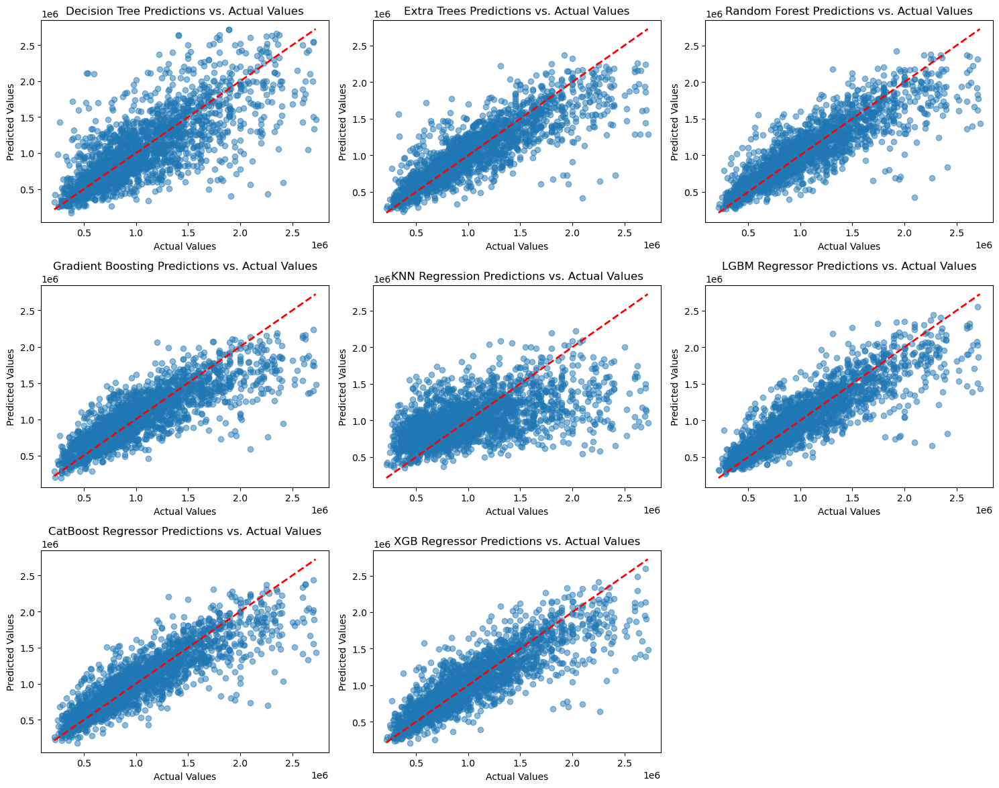

In [75]:
# Scater plot

# Define the grid layout
rows, cols = 3, 3

# Specify the figure size for the entire grid
plt.figure(figsize=(15, 12))

# Loop over models
for idx, (model_name, model) in enumerate(models.items(), 1):
    # Fit the model to training data
    model.fit(X_train_scaled, y_train)

    # Make predictions on the testing data
    y_pred = model.predict(X_test_scaled)

    # Scatter plot of Predictions vs. Actual Values for each model
    plt.subplot(rows, cols, idx)
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', linewidth=2)  # Diagonal line for perfect predictions
    plt.title(f'{model_name} Predictions vs. Actual Values')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')

# Adjust layout
plt.tight_layout()
plt.show()

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1863
[LightGBM] [Info] Number of data points in the train set: 8709, number of used features: 169
[LightGBM] [Info] Start training from score 1006297.458606


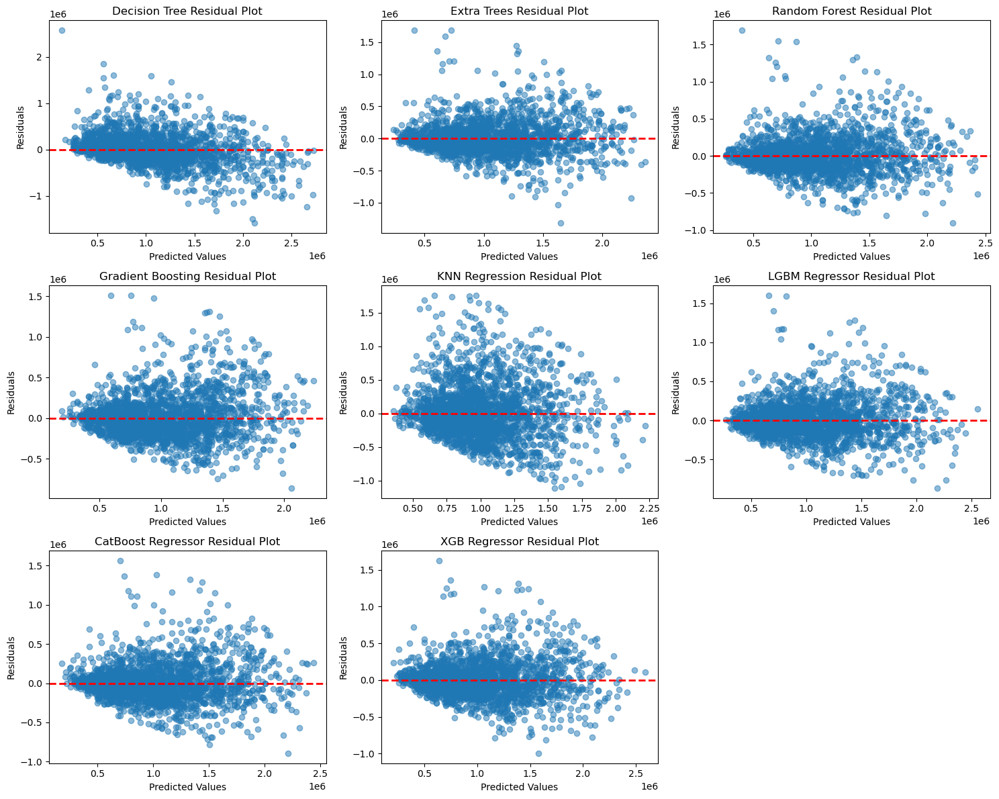

In [76]:
# Define the grid layout
rows, cols = 3, 3
plt.figure(figsize=(15, 12))

# Loop over models
for idx, (model_name, model) in enumerate(models.items(), 1):
    # Fit the model to training data
    model.fit(X_train_scaled, y_train)

    # Make predictions on the testing data
    y_pred = model.predict(X_test_scaled)

    # Calculate residuals
    residuals = y_test - y_pred

    # Residual plot for each model
    plt.subplot(rows, cols, idx)
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
    plt.title(f'{model_name} Residual Plot')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')

# Adjust layout
plt.tight_layout()
plt.show()

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1863
[LightGBM] [Info] Number of data points in the train set: 8709, number of used features: 169
[LightGBM] [Info] Start training from score 1006297.458606


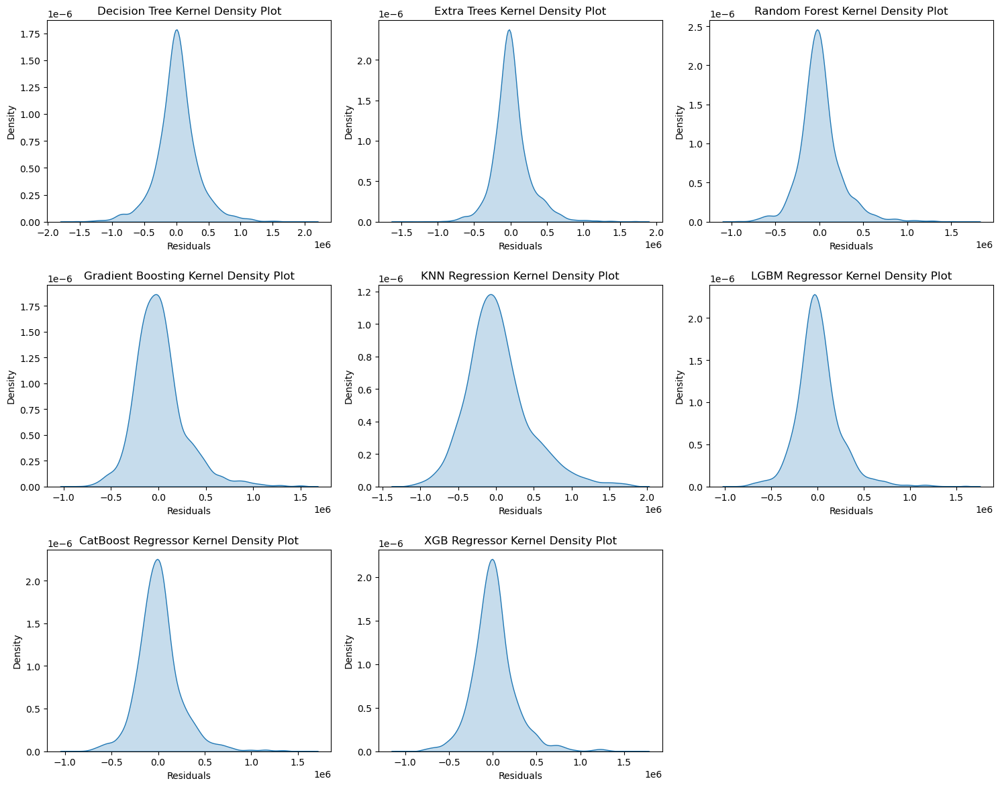

In [77]:
# # Kernel Density Plot
# # Define the grid layout
# rows, cols = 3, 3
# plt.figure(figsize=(15, 12))

# # Loop over models
# for idx, (model_name, model) in enumerate(models.items(), 1):
#     # Fit the model to training data
#     model.fit(X_train_scaled, y_train)

#     # Make predictions on the testing data
#     y_pred = model.predict(X_test_scaled)

#     # Calculate residuals
#     residuals = y_test - y_pred

#     # Kernel density plot for residuals of each model
#     plt.subplot(rows, cols, idx)
#     sns.kdeplot(residuals, fill=True)
#     plt.title(f'{model_name} Kernel Density Plot')
#     plt.xlabel('Residuals')
#     plt.ylabel('Density')

# # Adjust layout
# plt.tight_layout()
# plt.show()

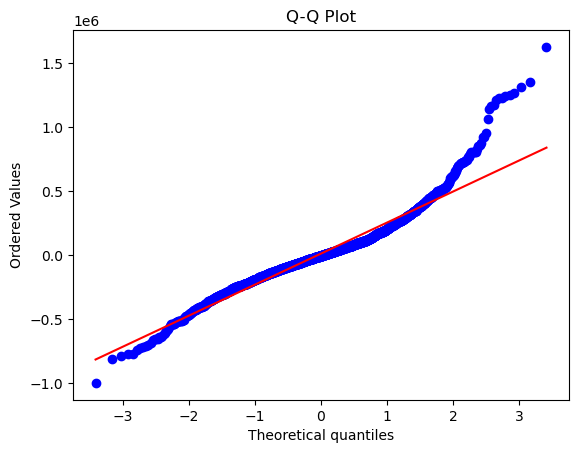

In [78]:
import scipy.stats as stats
import matplotlib.pyplot as plt

stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()


## Actual vs predicted 

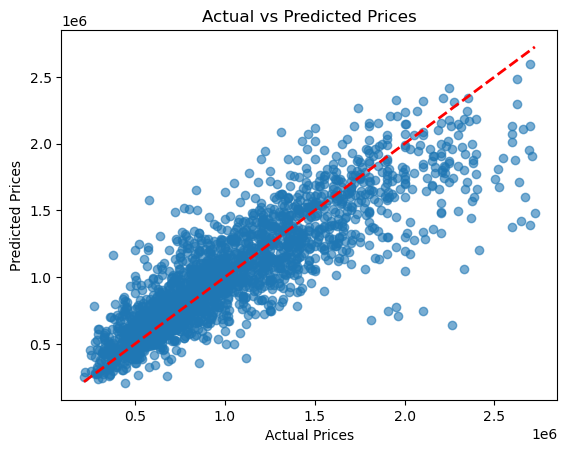

In [79]:
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Actual vs Predicted Prices")
plt.show()